In [1]:
import polars as pl
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm


## Analysis Findings

1. How has service changed over time in the city? (by time between buses)
* Looking at overall at a weighted median time until next bus, the additional time till next bus over the schedule has decreased since 2022 (chart 1).However, looking at weighted median time until next bus for actual vs scheduled (chart 2), we see that actual weight time till next bus increased from May 2022 to June 2023 and then began to decline again. At the same time, weighted median time until next bus for the schedule increased as well. Thus,the decrease in additional wait time compared to schedule did not come from an improvement in service but rather a more realistic schedule In April 2023 there was a dramatic change to the schedule along with a significant decrease in the actual time.

2. Where was service quality not returned in the city? (check)
* For the decrease in service (increase in time between buses) from 2022-11-07 to 2023-07-01, service in almost every community area service got worse (65) (except for West Lawn and Edison Park, which got better). These community areas are across the city. However for the increase in service around 2024-03-01, 32 community areas did see an improvement in service (decrease in wait time). Most are on the southside

3. Where are the longest wait times for the actual?
* Community areas with the longest wait time are at the edge of the city. 'OHARE' 'EDISON PARK' 'NORWOOD PARK' 'CLEARING' 'GARFIELD RIDGE'
 'HEGEWISCH' 'EAST SIDE' 'FOREST GLEN' 'FULLER PARK' 'MOUNT GREENWOOD'
 'JEFFERSON PARK' 'ARMOUR SQUARE' 'BEVERLY' 'ARCHER HEIGHTS' 'MORGAN PARK'

4. Where is service most different than schedule?
Overall has gotten more aligned. still a gap with recent service change

* Highest delay communities, no geographic trend
['GREATER GRAND CROSSING' 'NEAR SOUTH SIDE' 'ENGLEWOOD' 'DOUGLAS'
 'RIVERDALE' 'OAKLAND' 'SOUTH CHICAGO' 'CHATHAM' 'WEST TOWN'
 'HUMBOLDT PARK' 'AVONDALE' 'WEST RIDGE' 'ASHBURN' 'AUBURN GRESHAM'
 'WEST GARFIELD PARK']


5. Where is service most unpredictable? (variation q75-q25 is the highest)
[CLEARING' 'OHARE' 'GARFIELD RIDGE' 'LINCOLN PARK']

6. How has service changed over time in the city? (by number of buses)
* overall, the actual numbers of buses run has gotten closes to scheduled buses, however
* in 2023, actual number of buses run did not change much but schedule buses drop dramtically

7. Where did schedule get get?





## Helper Functions and Data Prep

In [2]:
# metrics overall over time
stops = pl.read_parquet("out/stops_metrics_all_periods.parquet")
ca_xwalk = pl.read_parquet('data/communities_stops.parquet')
ca_xwalk = ca_xwalk.select(['community','stpid']).rename({'stpid':'stop_id'})

stops = stops.join(ca_xwalk, on='stop_id', how='left', coalesce=True)
stops = stops.filter(~pl.col('rt').is_in(['5','169']))

# trips 
trips = pl.read_parquet("out/trips_metrics_all_periods.parquet")
trips = trips.filter(~pl.col('rt').is_in(['5','169']))


ca_boundaries = gpd.read_file('data/ca_boundaries.geojson')



In [3]:
def weighted_metric_grouping(df, period, metric, count, grouping):
    df = df.filter(pl.col('period') == period)
    df = df.with_columns(pl.col(count).sum().over(['period_value',grouping]).alias('trip_count'))
    df = df.with_columns((pl.col(count) / pl.col('trip_count')).alias('time_till_weight'))

    df_filtered = df.select(['rt','pid','period_value','community','time_till_weight', metric])
    df_filtered = df_filtered.filter(pl.col('time_till_weight').is_not_nan())

    df_filtered = df_filtered.sort(metric)

    # Calculate the cumulative sum of 'indweight'
    df_filtered = df_filtered.with_columns(pl.col("time_till_weight").cum_sum().over(['period_value',grouping]).alias("cum_sum"))

    #Find the median then take first value
    median = df_filtered.filter(pl.col("cum_sum")>= 0.5)
    final = median.group_by(['period_value',grouping], maintain_order=True).first().filter(pl.col("period_value")!= '2022-05-01').sort("period_value")
    final = final.with_columns((pl.col(metric).dt.total_seconds() / 60).alias("median_minutes"))

    return final.select(['period_value',grouping,'median_minutes'])

In [4]:
def join_grouped_df(actual_df, schedule_df, grouping):
    actual_df = actual_df.rename({'median_minutes': 'actual_median_minutes'})
    schedule_df = schedule_df.rename({'median_minutes': 'schedule_median_minutes'})

    join = actual_df.join(schedule_df, on=['period_value',grouping], how = 'left', coalesce=True).to_pandas()

    join = join[join['period_value'] >= '2022-06-01']

    return join 

In [5]:
def weighted_metric(df, period, metric, count):
    df = df.filter(pl.col('period') == period)
    df = df.with_columns(pl.col(count).sum().over('period_value').alias('trip_count'))
    df = df.with_columns((pl.col(count) / pl.col('trip_count')).alias('time_till_weight'))

    df_filtered = df.select(['rt','pid','period_value','time_till_weight', metric])
    df_filtered = df_filtered.filter(pl.col('time_till_weight').is_not_nan())

    df_filtered = df_filtered.sort(metric)

    # Calculate the cumulative sum of 'indweight'
    df_filtered = df_filtered.with_columns(pl.col("time_till_weight").cum_sum().over('period_value').alias("cum_sum"))


    #Find the median then take first value
    median = df_filtered.filter(pl.col("cum_sum")>= 0.5)
    final = median.group_by("period_value", maintain_order=True).first().filter(pl.col("period_value")!= '2022-05-01').sort("period_value")
    final = final.with_columns((pl.col(metric).dt.total_seconds() / 60).alias("median_minutes"))

    return final.select(['period_value', 'median_minutes'])


In [6]:
def join_df(actual_df, schedule_df):
    actual_df = actual_df.rename({'median_minutes': 'actual_median_minutes'})
    schedule_df = schedule_df.rename({'median_minutes': 'schedule_median_minutes'})

    join = actual_df.join(schedule_df, on='period_value', how = 'left', coalesce=True).to_pandas()

    join = join[join['period_value'] >= '2022-06-01']

    return join 

In [7]:
actual_month = weighted_metric(stops, 'month_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus')
schedule_month = weighted_metric(stops, 'month_abs', 'median_schedule_time_till_next_bus' , 'count_schedule_time_till_next_bus')
join_month = join_df(actual_month, schedule_month)

actual_week = weighted_metric(stops, 'week_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus')
schedule_week = weighted_metric(stops, 'week_abs', 'median_schedule_time_till_next_bus' , 'count_schedule_time_till_next_bus')
join_week = join_df(actual_week, schedule_week)

actual_week_delay = weighted_metric(stops, 'week_abs', 'time_till_next_bus_delay', 'count_actual_time_till_next_bus')
actual_month_delay = weighted_metric(stops, 'month_abs', 'time_till_next_bus_delay', 'count_actual_time_till_next_bus')




In [8]:
actual_week_ca = weighted_metric_grouping(stops, 'week_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'community')
actual_week_rt = weighted_metric_grouping(stops, 'week_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'rt')

schedule_week_ca = weighted_metric_grouping(stops, 'week_abs', 'median_schedule_time_till_next_bus', 'count_schedule_time_till_next_bus', 'community')
schedule_week_rt = weighted_metric_grouping(stops, 'week_abs', 'median_schedule_time_till_next_bus', 'count_schedule_time_till_next_bus', 'rt')

join_week_ca = join_grouped_df(actual_week_ca, schedule_week_ca, 'community')
join_week_rt = join_grouped_df(actual_week_rt, schedule_week_rt, 'rt')

actual_week = weighted_metric(stops, 'week_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus')
schedule_week = weighted_metric(stops, 'week_abs', 'median_schedule_time_till_next_bus' , 'count_schedule_time_till_next_bus')
join_week = join_df(actual_week, schedule_week)

actual_month_ca = weighted_metric_grouping(stops, 'month_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'community')
actual_month_rt = weighted_metric_grouping(stops, 'month_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'rt')

schedule_month_ca = weighted_metric_grouping(stops, 'month_abs', 'median_schedule_time_till_next_bus', 'count_schedule_time_till_next_bus', 'community')
schedule_month_rt = weighted_metric_grouping(stops, 'month_abs', 'median_schedule_time_till_next_bus', 'count_schedule_time_till_next_bus', 'rt')

join_month_ca = join_grouped_df(actual_month_ca, schedule_month_ca, 'community')
join_month_rt = join_grouped_df(actual_month_rt, schedule_month_rt, 'rt')

actual_month = weighted_metric(stops, 'month_abs', 'median_actual_time_till_next_bus', 'count_actual_time_till_next_bus')
schedule_month = weighted_metric(stops, 'month_abs', 'median_schedule_time_till_next_bus' , 'count_schedule_time_till_next_bus')
join_month = join_df(actual_month, schedule_month)


## Interesting Thing 1
Looking at overall at a weighted median time until next bus, the additional weight time over the schedule has decreased since 2022 (chart 1)

However, looking at weighted median time until next bus for actual vs scheduled (chart 2), we see that actual weight time till next bus increased from May 2022 to June 2023 and then began to decline again. At the same time, weighted median time until next bus for the schedule increased as well. Thus the decrease in additional wait time compared to schedule came from a decrease in service but a more realistic schedule.

In April 2023 there was a dramatic change to the schedule along with a significant decrease in the actual time


Next steps
* which routes / community areas had the largest increase in wait time from june 2022 to june 2023
* which routes / community areas had the largest decrease in wait times from april 2023 to now


In [72]:
actual_month_delay.write_csv('out/for_chart/month_delay.csv')

<Axes: title={'center': 'Median Excess Time Till Next Bus'}, xlabel='month', ylabel='minutes'>

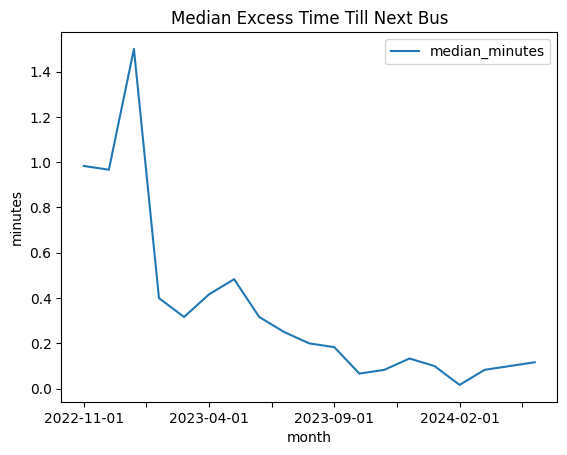

In [60]:
actual_month_delay.to_pandas().plot(x='period_value', y='median_minutes', title='Median Excess Time Till Next Bus', xlabel='month', ylabel='minutes')

In [46]:
join_month

,period_value,actual_median_minutes,schedule_median_minutes,comparative_sched_inc
0,2022-06-01,14.016667,NaN,NaN
1,2022-07-01,14.316667,NaN,NaN
2,2022-08-01,13.850000,NaN,NaN
3,2022-09-01,13.883333,NaN,NaN
4,2022-10-01,13.900000,NaN,NaN
5,2022-11-01,13.950000,12.5,-2.5
6,2022-12-01,14.050000,12.5,-2.5
7,2023-01-01,14.666667,12.5,-2.5
8,2023-02-01,14.700000,14.0,-1.0
9,2023-03-01,14.733333,14.0,-1.0


<Axes: title={'center': 'Median Time Till Next Bus'}, xlabel='month', ylabel='minutes'>

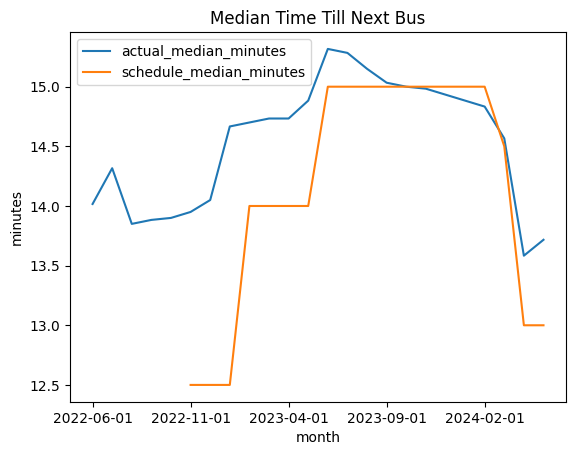

In [45]:
join_month.plot(x='period_value', y=['actual_median_minutes', 'schedule_median_minutes'], title='Median Time Till Next Bus', xlabel='month', ylabel='minutes')

In [79]:
join_month.to_csv('out/for_chart/a_s_time.csv')

## Interesting Thing 2

What we care about is community areas where the schedule increased (which is true across the city) and but never recovered.

For the decrease in service (increase in time between buses) from 2022-11-07 to 2023-07-01, service in almost every community area service got worse (65) (except for West Lawn and Edison Park, which got better). These community areas are across the city

However for the increase in service around 2024-03-01, 32 community areas did see an improvement in service (decrease in wait time). Most are on the southside



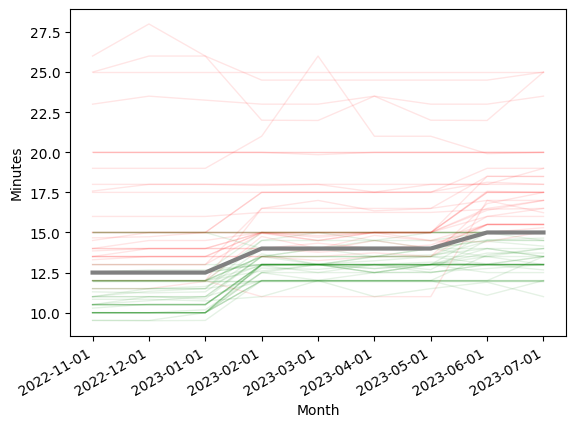

<Figure size 1000x1000 with 0 Axes>

In [38]:
# schedule from 2022-11-07 to 2023-07-01
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filters_ca = join_month_ca[join_month_ca['period_value'].between('2022-11-01', '2023-07-01')]
filters_overall = join_month[join_month['period_value'].between('2022-11-01', '2023-07-01')]

overall_max = join_month[join_month['period_value']== '2023-07-01']['schedule_median_minutes'].values[0]

CAs = join_month_ca['community'].unique()


for ca in CAs:
    subset = filters_ca[filters_ca['community'] == ca]
    if len(subset.index) == 0:
        continue
    if subset[subset['period_value'] == '2023-07-01']['schedule_median_minutes'].values[0] > overall_max:
        ax.plot(subset['period_value'], subset['schedule_median_minutes'], label=ca,linewidth=1, alpha=0.1, color = 'red')
    else:
        ax.plot(subset['period_value'], subset['schedule_median_minutes'], label=ca,linewidth=1, alpha=0.1, color = 'green')

ax.plot(filters_overall['period_value'], filters_overall['schedule_median_minutes'], label='overall', linewidth=3,color = 'grey')

ax.set_xlabel('Month')
ax.set_ylabel('Minutes')
fig.autofmt_xdate()
plt.show()


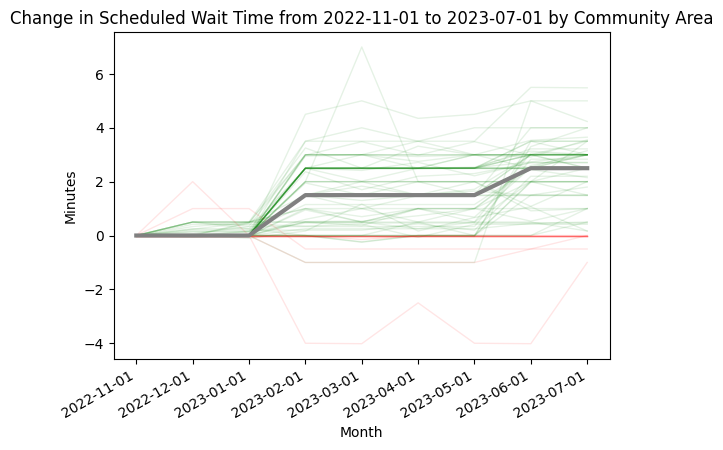

<Figure size 1000x1000 with 0 Axes>

In [10]:
#from '2022-11-01' to '2023-07-01'
def plot_wait_time_change(join_month_ca, start_date, end_date, type):
    #data prep
    # set zero at 2022-11-01 level to see increase
    baseline_date = start_date

    # Filter the df for the specified period
    start_sched = join_month_ca[join_month_ca['period_value'] == baseline_date][['community', 'schedule_median_minutes']]

    # Rename the column 
    start_sched = start_sched.rename(columns={'schedule_median_minutes': 'start_sched_inc'})

    # Merge the back into the original df
    join_month_ca = join_month_ca.merge(start_sched, on='community', how='left')

    join_month_ca['comparative_sched_inc'] = join_month_ca['schedule_median_minutes'] - join_month_ca['start_sched_inc']

    #overall to compare to
    baseline_sched = join_month[join_month['period_value'] == baseline_date]['schedule_median_minutes'].values[0]
    join_month['comparative_sched_inc'] = join_month['schedule_median_minutes'] - baseline_sched


    fig, ax = plt.subplots()
    plt.figure(figsize=(10,10))

    filters_ca = join_month_ca[(join_month_ca['period_value'].between(start_date, end_date))]

    filters_overall = join_month[join_month['period_value'].between(start_date, end_date)]

    CAs = join_month_ca['community'].unique()

    filters_ca = filters_ca.sort_values(by = ['community','period_value'], ascending = [True, True])
    filters_overall = filters_overall.sort_values(by = ['period_value'], ascending = True)

    worse_ca = []
    better_ca = []

    if type == 'inc':
        filter = 0
        colors = ['red','green']
    else:
        filter = -0.00001
        colors = ['green','red']

    for ca in CAs:
        subset = filters_ca[filters_ca['community'] == ca]
        if len(subset.index) == 0:
            continue
        if subset[subset['period_value'] == end_date]['comparative_sched_inc'].values[0] <= filter:
            ax.plot(subset['period_value'], subset['comparative_sched_inc'], label=ca,linewidth=1, alpha=0.1, color = colors[0])
            worse_ca.append(ca)
        else:
            ax.plot(subset['period_value'], subset['comparative_sched_inc'], label=ca,linewidth=1, alpha=0.1, color = colors[1])
            better_ca.append(ca)

    ax.plot(filters_overall['period_value'], filters_overall['comparative_sched_inc'], label='overall', linewidth=3,color = 'grey')

    ax.set_xlabel('Month')
    ax.set_ylabel('Minutes')
    ax.set_title('Change in Scheduled Wait Time from ' + start_date + ' to ' + end_date + ' by Community Area')
    fig.autofmt_xdate()
    plt.show()
    return worse_ca, better_ca, filters_ca, join_month_ca,filters_overall
 

worse_ca, better_ca, filters_ca, join_month_ca_compare_inc, filters_overall_inc = plot_wait_time_change(join_month_ca,'2022-11-01', '2023-07-01', 'inc')

In [ ]:
net_change_edit.explore(column="comparative_sched_inc", legend=True,  legend_kwds={"label": "Net Change in Wait Time"}, tiles = 'cartodbpositron', cmap='RdYlGn')


In [165]:
net_change_edit.explore(column="comparative_sched_inc", legend=True,  legend_kwds={"label": "Net Change in Wait Time"}, tiles = 'cartodbpositron', cmap='RdYlGn')


In [116]:
ca_boundaries[ca_boundaries['community'].isin(better_ca)].explore(tiles ='CartoDB positron', style = {'color':'#800000'}, popup_fields = ['community'])

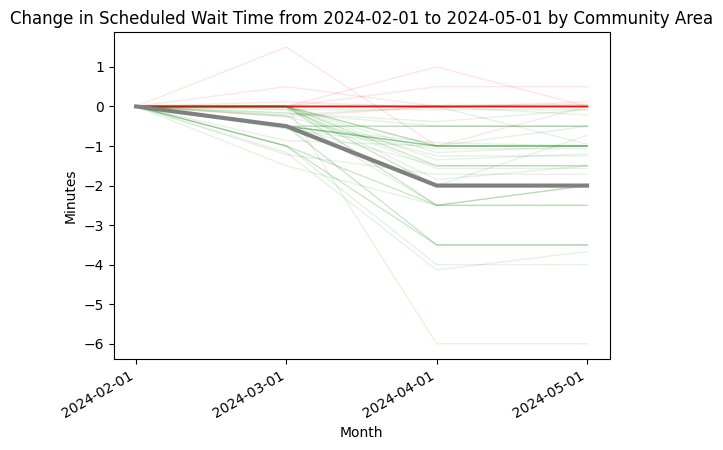

<Figure size 1000x1000 with 0 Axes>

In [16]:
worse_ca, better_ca, filters_ca, join_month_ca_compare_desc,filters_overall_desc = plot_wait_time_change(join_month_ca,'2024-02-01', '2024-05-01', 'dec')

In [112]:
filters_overall_desc

,period_value,actual_median_minutes,schedule_median_minutes,comparative_sched_inc
20,2024-02-01,14.833333,15.0,0.0
21,2024-03-01,14.566667,14.5,-0.5
22,2024-04-01,13.583333,13.0,-2.0
23,2024-05-01,13.716667,13.0,-2.0


In [101]:
ca_boundaries[ca_boundaries['community'].isin(better_ca)].explore(tiles ='CartoDB positron', style = {'color':'#eaaa00ff' })

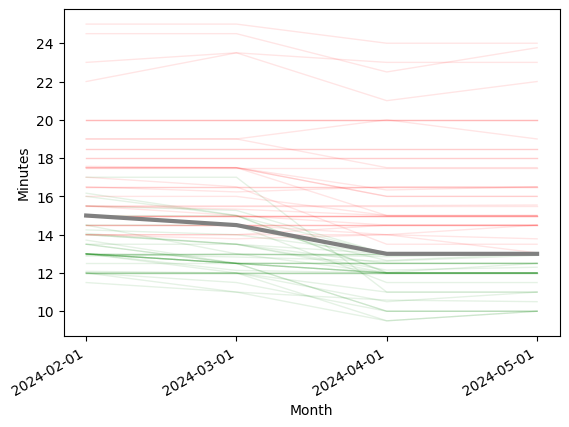

<Figure size 1000x1000 with 0 Axes>

In [43]:
# schedule from 2024-02-01 to 2024-05-01
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filters_ca = join_month_ca[join_month_ca['period_value'].between('2024-02-01', '2024-05-01')]
filters_overall = join_month[join_month['period_value'].between('2024-02-01', '2024-05-01')]

overall_min = join_month[join_month['period_value']== '2024-05-01']['schedule_median_minutes'].values[0]

CAs = join_month_ca['community'].unique()


for ca in CAs:
    subset = filters_ca[filters_ca['community'] == ca]
    if len(subset.index) == 0:
        continue

    # if subset[subset['period_value'] == '2024-05-01']['schedule_median_minutes'].values[0] ==subset[subset['period_value'] == '2024-02-01']['schedule_median_minutes'].values[0]:
    #     ax.plot(subset['period_value'], subset['schedule_median_minutes'], label=ca,linewidth=1, alpha=0.5, color = 'black')
    if subset[subset['period_value'] == '2024-05-01']['schedule_median_minutes'].values[0] > overall_min:
        
        ax.plot(subset['period_value'], subset['schedule_median_minutes'], label=ca,linewidth=1, alpha=0.1, color = 'red')
    else:
        ax.plot(subset['period_value'], subset['schedule_median_minutes'], label=ca,linewidth=1, alpha=0.1, color = 'green')

ax.plot(filters_overall['period_value'], filters_overall['schedule_median_minutes'], label='overall', linewidth=3,color = 'grey')

ax.set_xlabel('Month')
ax.set_ylabel('Minutes')
fig.autofmt_xdate()
plt.show()

Wait times are the worst near the edge of the city (and near train lines in the middle of city)

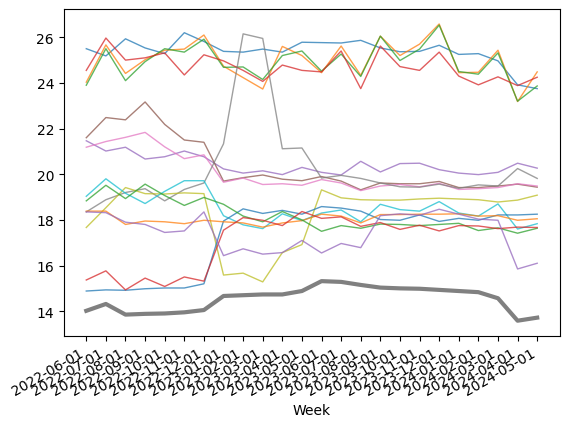

<Figure size 1000x1000 with 0 Axes>

Highest wait time communities:
['OHARE' 'EDISON PARK' 'NORWOOD PARK' 'CLEARING' 'GARFIELD RIDGE'
 'HEGEWISCH' 'EAST SIDE' 'FOREST GLEN' 'FULLER PARK' 'MOUNT GREENWOOD'
 'JEFFERSON PARK' 'ARMOUR SQUARE' 'BEVERLY' 'ARCHER HEIGHTS' 'MORGAN PARK']


In [37]:
highest_wait_time = join_month_ca.groupby('community').median('actual_median_minutes').sort_values('actual_median_minutes', ascending=False).head(15).reset_index()['community'].unique()


fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = highest_wait_time

for ca in CAs:
    subset = join_month_ca[join_month_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['actual_median_minutes'], label=ca,linewidth=1, alpha=0.75)

ax.plot(join_month['period_value'], join_month['actual_median_minutes'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Week')


fig.autofmt_xdate()
plt.show()

print("Highest wait time communities:")
print(highest_wait_time)

ca_boundaries[ca_boundaries['community'].isin(highest_wait_time)].explore(tiles = 'CartoDB positron')

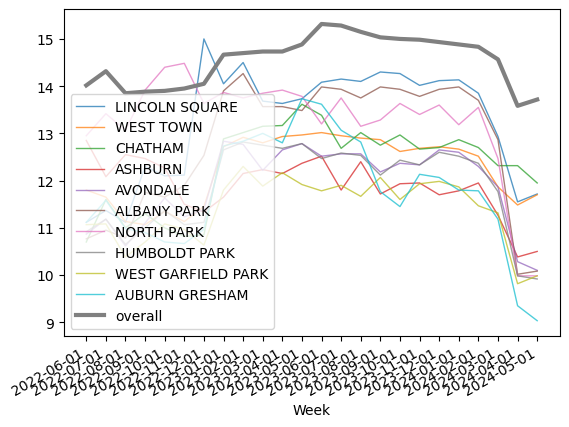

<Figure size 1000x1000 with 0 Axes>

Lowest wait time communities:
['LINCOLN SQUARE' 'WEST TOWN' 'CHATHAM' 'ASHBURN' 'AVONDALE' 'ALBANY PARK'
 'NORTH PARK' 'HUMBOLDT PARK' 'WEST GARFIELD PARK' 'AUBURN GRESHAM']


In [243]:
shortest_wait_time = join_month_ca.groupby('community').min('actual_median_minutes').sort_values('actual_median_minutes', ascending=False).tail(10).reset_index()['community'].unique()


fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = shortest_wait_time

for ca in CAs:
    subset = join_month_ca[join_month_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['actual_median_minutes'], label=ca,linewidth=1, alpha=0.75)

ax.plot(join_month['period_value'], join_month['actual_median_minutes'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Week')
ax.legend(loc='lower left')

fig.autofmt_xdate()
plt.show()

print("Lowest wait time communities:")
print(shortest_wait_time)

ca_boundaries[ca_boundaries['community'].isin(shortest_wait_time)].explore()

Where is service most different from the schedule?
On Avg ['GREATER GRAND CROSSING' 'NEAR SOUTH SIDE' 'ENGLEWOOD' 'DOUGLAS'
 'RIVERDALE' 'OAKLAND' 'SOUTH CHICAGO' 'CHATHAM' 'WEST TOWN'
 'HUMBOLDT PARK' 'AVONDALE' 'WEST RIDGE' 'ASHBURN' 'AUBURN GRESHAM'
 'WEST GARFIELD PARK'] is delayed from schedule, not geographic patterns
  

In [170]:
join_month_ca['diff'] = join_month_ca['actual_median_minutes'] - join_month_ca['schedule_median_minutes']
join_month['diff'] = join_month['actual_median_minutes'] - join_month['schedule_median_minutes']

In [226]:
def plot(group_df, grouping, overall_df, metric, filter:list):
    # schedule from 2022-11-07 to 2023-07-01
    fig, ax = plt.subplots()
    plt.figure(figsize=(10,10))

    filters_ca = group_df[group_df['period_value'].between(filter[0], filter[1])]
    filters_overall = overall_df[join_month['period_value'].between(filter[0], filter[1])]

    overall_max = overall_df[overall_df['period_value']== filter[1]][metric].values[0]

    CAs = group_df[grouping].unique()


    for ca in CAs:
        subset = filters_ca[filters_ca[grouping] == ca]
        if len(subset.index) == 0:
            continue
        if subset[subset['period_value'] == filter[1]][metric].values[0] > overall_max:
            ax.plot(subset['period_value'], subset[metric], label=ca,linewidth=1, alpha=0.1, color = 'red')
        else:
            ax.plot(subset['period_value'], subset[metric], label=ca,linewidth=1, alpha=0.1, color = 'green')

    ax.plot(filters_overall['period_value'], filters_overall[metric], label='overall', linewidth=3,color = 'grey')

    ax.set_xlabel(type)
    ax.set_ylabel('Minutes')
    fig.autofmt_xdate()
    plt.show()

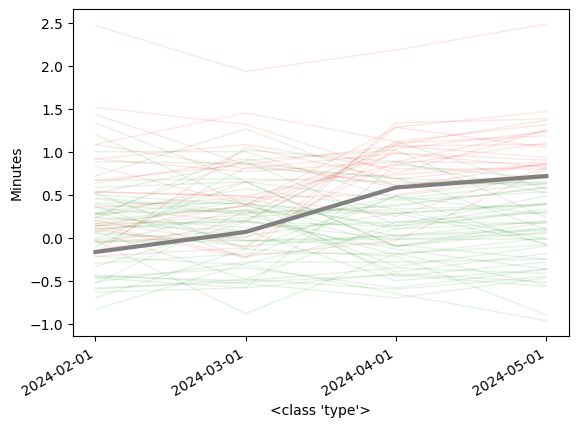

<Figure size 1000x1000 with 0 Axes>

In [255]:
plot(join_month_ca,'community', join_month, 'diff', ['2024-02-01', '2024-05-01'])

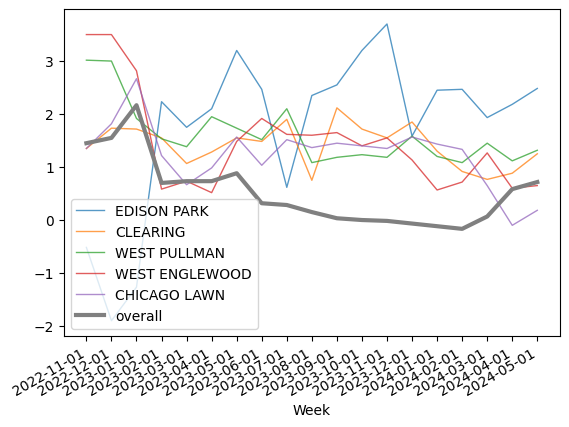

<Figure size 1000x1000 with 0 Axes>

Highest delay communities:
['EDISON PARK' 'CLEARING' 'WEST PULLMAN' 'WEST ENGLEWOOD' 'CHICAGO LAWN']


In [252]:
most_delayed = join_month_ca.groupby('community').median('diff').sort_values('diff', ascending=False).head(5).reset_index()['community'].unique()

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = most_delayed

for ca in CAs:
    subset = join_month_ca[join_month_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['diff'], label=ca,linewidth=1, alpha=0.75)

ax.plot(join_month['period_value'], join_month['diff'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Week')

fig.autofmt_xdate()
ax.legend(loc='lower left')
plt.show()

print("Highest delay communities:")
print(most_delayed)

ca_boundaries[ca_boundaries['community'].isin(most_delayed)].explore()

Where is the service the most unpredictable?
HEGEWISCH' 'EAST SIDE used to be really unpredictable but have gotten back to city avg
CLEARING is always bad

In [222]:
#data prep
actual_q75_month = weighted_metric(stops, 'month_abs', 'q75_actual_time_till_next_bus', 'count_actual_time_till_next_bus')
actual_q75_month = actual_q75_month.rename({'median_minutes': 'q75_actual_time_till_next_bus'})

actual_q25_month = weighted_metric(stops, 'month_abs', 'q25_actual_time_till_next_bus' , 'count_actual_time_till_next_bus')
actual_q25_month = actual_q25_month.rename({'median_minutes': 'q25_actual_time_till_next_bus'})

actual_predictable = actual_q75_month.join(actual_q25_month, on='period_value', how = 'left', coalesce=True)
actual_predictable =actual_predictable.to_pandas()

actual_predictable['predictable'] = actual_predictable['q75_actual_time_till_next_bus'] - actual_predictable['q25_actual_time_till_next_bus']

# for CA
actual_q75_month_ca = weighted_metric_grouping(stops, 'month_abs', 'q75_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'community')
actual_q75_month_ca = actual_q75_month_ca.rename({'median_minutes': 'q75_actual_time_till_next_bus'})

actual_q25_month_ca = weighted_metric_grouping(stops, 'month_abs', 'q25_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'community')
actual_q25_month_ca = actual_q25_month_ca.rename({'median_minutes': 'q25_actual_time_till_next_bus'})

actual_predictable_ca = actual_q75_month_ca.join(actual_q25_month_ca, on=['period_value', 'community'], how = 'left', coalesce=True)
actual_predictable_ca =actual_predictable_ca.to_pandas()
actual_predictable_ca['predictable'] = actual_predictable_ca['q75_actual_time_till_next_bus'] - actual_predictable_ca['q25_actual_time_till_next_bus']

# for rt

actual_q75_month_rt = weighted_metric_grouping(stops, 'month_abs', 'q75_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'rt')
actual_q75_month_rt = actual_q75_month_rt.rename({'median_minutes': 'q75_actual_time_till_next_bus'})

actual_q25_month_rt = weighted_metric_grouping(stops, 'month_abs', 'q25_actual_time_till_next_bus', 'count_actual_time_till_next_bus', 'rt')
actual_q25_month_rt = actual_q25_month_rt.rename({'median_minutes': 'q25_actual_time_till_next_bus'})

actual_predictable_rt = actual_q75_month_rt.join(actual_q25_month_rt, on=['period_value', 'rt'], how = 'left', coalesce=True)
actual_predictable_rt =actual_predictable_rt.to_pandas()
actual_predictable_rt['predictable'] = actual_predictable_rt['q75_actual_time_till_next_bus'] - actual_predictable_rt['q25_actual_time_till_next_bus']





In [229]:
actual_predictable_rt_fitler  =actual_predictable_rt[actual_predictable_rt['predictable'] < 100]

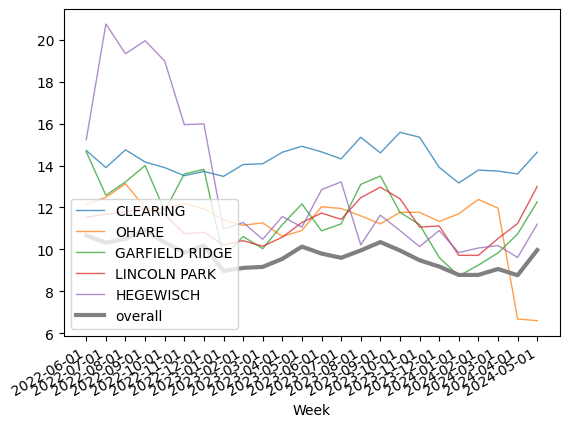

<Figure size 1000x1000 with 0 Axes>

Most unpredictable communities:
['CLEARING' 'OHARE' 'GARFIELD RIDGE' 'LINCOLN PARK' 'HEGEWISCH']


In [256]:
most_unpredicatable = actual_predictable_ca.groupby('community').median('predictable').sort_values('predictable', ascending=False).head(5).reset_index()['community'].unique()

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = most_unpredicatable

for ca in CAs:
    subset = actual_predictable_ca[actual_predictable_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['predictable'], label=ca,linewidth=1, alpha=0.75)

ax.plot(actual_predictable['period_value'], actual_predictable['predictable'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Week')

fig.autofmt_xdate()
ax.legend(loc='lower left')

plt.show()

print("Most unpredictable communities:")
print(most_unpredicatable)

ca_boundaries[ca_boundaries['community'].isin(most_unpredicatable)].explore()

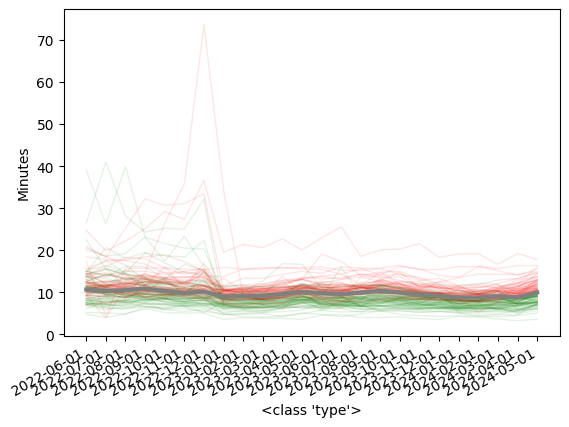

<Figure size 1000x1000 with 0 Axes>

In [230]:
plot(actual_predictable_rt_fitler, 'rt',actual_predictable, 'predictable', ['2022-06-01', '2024-05-01'])

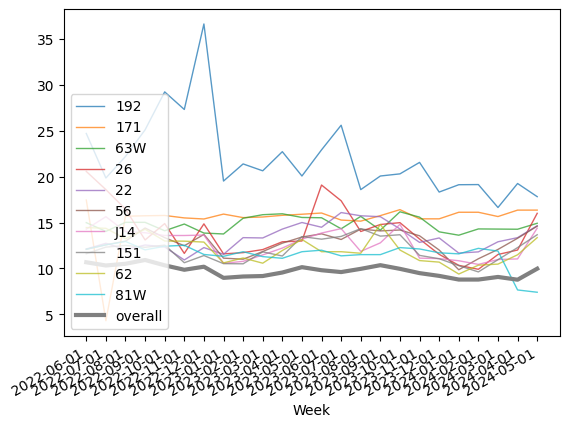

<Figure size 1000x1000 with 0 Axes>

Highest delay communities:
['CLEARING' 'OHARE' 'GARFIELD RIDGE' 'LINCOLN PARK' 'HEGEWISCH']


In [232]:
most_unpredicatable = actual_predictable_rt_fitler.groupby('rt').median('predictable').sort_values('predictable', ascending=False).head(10).reset_index()['rt'].unique()

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = most_delayed

for ca in CAs:
    subset = actual_predictable_rt_fitler[actual_predictable_ca['rt'] == ca]
    ax.plot(subset['period_value'], subset['predictable'], label=ca,linewidth=1, alpha=0.75)

ax.plot(actual_predictable['period_value'], actual_predictable['predictable'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Week')

fig.autofmt_xdate()
ax.legend(loc='lower left')

plt.show()

print("Highest delay communities:")
print(most_delayed)

ca_boundaries[ca_boundaries['community'].isin(most_delayed)].explore()

In [ ]:
join_month_ca['diff'] = join_month_ca['actual_median_minutes'] - join_month_ca['schedule_median_minutes']
join_month['diff'] = join_month['actual_median_minutes'] - join_month['schedule_median_minutes']

In [143]:

# Filter the df for the specified period
start_actual = join_month_ca[join_month_ca['period_value'] == '2022-11-01'][['community', 'actual_median_minutes']]
start_sched = join_month_ca[join_month_ca['period_value'] == '2022-11-01'][['community', 'schedule_median_minutes']]

# Rename the column 
start_actual = start_actual.rename(columns={'actual_median_minutes': 'start_actual'})
start_sched = start_sched.rename(columns={'schedule_median_minutes': 'start_sched'})

# Merge the back into the original df
join_month_ca = join_month_ca.merge(start_actual, on='community', how='left')
join_month_ca = join_month_ca.merge(start_sched, on='community', how='left')

join_month_ca['comparative_actual'] = join_month_ca['actual_median_minutes'] - join_month_ca['start_actual']
join_month_ca['comparative_sched'] = join_month_ca['schedule_median_minutes'] - join_month_ca['start_sched']

#overall to compare to
baseline_sched = join_month[join_month['period_value'] == '2022-11-01']['schedule_median_minutes'].values[0]
join_month['comparative_sched'] = join_month['schedule_median_minutes'] - baseline_sched

baseline_actual = join_month[join_month['period_value'] == '2022-11-01']['actual_median_minutes'].values[0]
join_month['comparative_actual'] = join_month['actual_median_minutes'] - baseline_actual

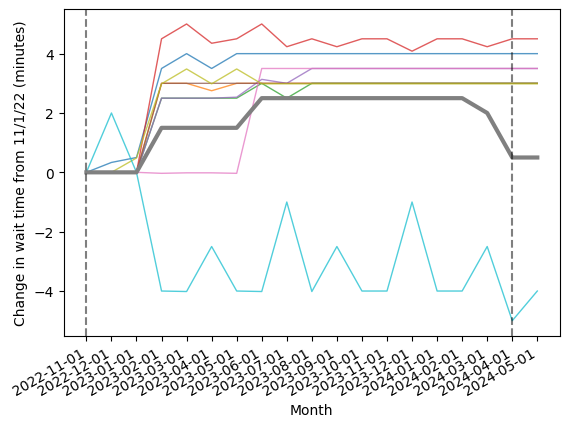

<Figure size 1000x1000 with 0 Axes>

In [144]:

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
keep_ca = join_month_ca[(join_month_ca['period_value'] == '2024-05-01') & (~join_month_ca['comparative_sched'].between(-2,2.5))]['community']

CAs = join_month_ca[join_month_ca['community'].isin(keep_ca)]['community'].unique()


for ca in CAs:
    subset = join_month_ca[join_month_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['comparative_sched'], label=ca,linewidth=1, alpha=0.75)

ax.plot(join_month['period_value'], join_month['comparative_sched'], label='overall', linewidth=3,color = 'grey')


ax.set_xlabel('Month')
ax.set_ylabel('Change in wait time from 11/1/22 (minutes)')
ax.axvline(x='2022-11-01', color='black', linestyle='--', alpha=0.5)
ax.axvline(x='2024-04-01', color='black', linestyle='--', alpha=0.5)
fig.autofmt_xdate()
plt.show()


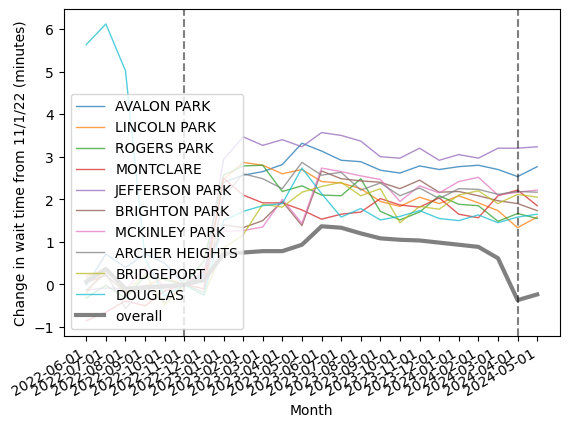

<Figure size 1000x1000 with 0 Axes>

In [148]:

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
keep_ca = join_month_ca[(join_month_ca['period_value'] == '2024-05-01') & (join_month_ca['comparative_actual'] >= 1.5)]['community']

CAs = join_month_ca[join_month_ca['community'].isin(keep_ca)]['community'].unique()


for ca in CAs:
    subset = join_month_ca[join_month_ca['community'] == ca]
    ax.plot(subset['period_value'], subset['comparative_actual'], label=ca,linewidth=1, alpha=0.75)

ax.plot(join_month['period_value'], join_month['comparative_actual'], label='overall', linewidth=3,color = 'grey')

ax.legend(loc='lower left')
ax.set_xlabel('Month')
ax.set_ylabel('Change in wait time from 11/1/22 (minutes)')
ax.axvline(x='2022-11-01', color='black', linestyle='--', alpha=0.5)
ax.axvline(x='2024-04-01', color='black', linestyle='--', alpha=0.5)
fig.autofmt_xdate()
plt.show()

In [149]:
ca_boundaries[ca_boundaries['community'].isin(keep_ca)].explore()

In [401]:
# look at community Area and schedule
# which areas had the biggest change from '2022-11-07' to '2023-06-26'

def investigate_change(df, grouping, start_date, end_date): 
        
    first_increase =df[(df['period_value'] == start_date) | (df['period_value'] == end_date)]

    first_increase = first_increase.sort_values(by = [grouping,'period_value'], ascending = [True, True])
    first_increase['diff_sched'] = first_increase.groupby(grouping)['schedule_median_minutes'].diff()
    first_increase['diff_actual'] = first_increase.groupby(grouping)['actual_median_minutes'].diff()

    first_increase['before_sched'] = first_increase[first_increase['period_value'] == start_date]['schedule_median_minutes']
    first_increase['after_sched'] = first_increase[first_increase['period_value'] == end_date]['schedule_median_minutes']
    first_increase['before_actual'] = first_increase[first_increase['period_value'] == start_date]['actual_median_minutes']
    first_increase['after_actual'] = first_increase[first_increase['period_value'] == end_date]['actual_median_minutes']

    changes_df = first_increase.groupby(grouping)[['diff_sched','diff_actual','before_sched','after_sched', 'before_actual', 'after_actual']].sum().reset_index()

    return changes_df

In [406]:

start_date_decrease = '2022-11-01'
end_date_decrease = '2023-07-01'

start_date_increase = '2024-03-01'
end_date_increase = '2024-04-01'

decrease_rt = investigate_change(join_rt, 'rt',start_date_decrease, end_date_decrease )
decrease_ca = investigate_change(join_ca, 'community', start_date_decrease, end_date_decrease)

increase_rt = investigate_change(join_rt, 'rt',start_date_increase, end_date_increase )
increase_ca = investigate_change(join_ca, 'community', start_date_increase, end_date_increase)

how has service changed according to number of buses for each area

In [26]:
period = 'month_abs'
bus_stops = stops.filter(pl.col('period') == period).select(['rt','pid','stop_id','period_value','community','median_actual_num_buses','median_schedule_num_buses'])
bus_stops = bus_stops.fill_null(0)
bus_stops_grouped = bus_stops.group_by(['community','period_value']).agg(pl.sum('median_actual_num_buses').alias('actual_count'), 
                                    pl.sum('median_schedule_num_buses').alias('schedule_count'))

bus_stops_grouped = bus_stops_grouped.with_columns((pl.col('actual_count') / pl.col('schedule_count')).alias('actual_to_schedule_ratio'))
bus_stops_grouped_month = bus_stops_grouped.to_pandas()


In [73]:
period = 'week_abs'
bus_stops = stops.filter(pl.col('period') == period).select(['rt','pid','stop_id','period_value','community','median_actual_num_buses','median_schedule_num_buses'])
bus_stops = bus_stops.fill_null(0)
bus_stops_grouped = bus_stops.group_by(['community','period_value']).agg(pl.sum('median_actual_num_buses').alias('actual_count'), 
                                    pl.sum('median_schedule_num_buses').alias('schedule_count'))

bus_stops_grouped = bus_stops_grouped.with_columns((pl.col('actual_count') / pl.col('schedule_count')).alias('actual_to_schedule_ratio'))
bus_stops_grouped_week = bus_stops_grouped.to_pandas()

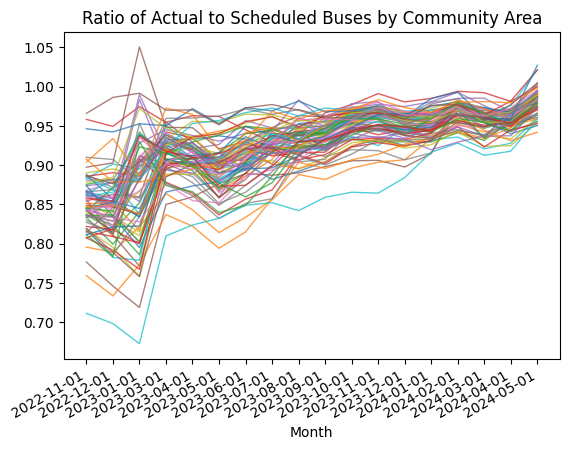

<Figure size 1000x1000 with 0 Axes>

In [150]:
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filter = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'] >= '2022-11-01') & (bus_stops_grouped_month['period_value'] != '2023-02-01')]
CAs = filter['community'].unique()

filter = filter.sort_values(by = ['community','period_value'], ascending = [True, True])

#CAs = CAs[:1]

#CAs = CAs[:4]

for ca in CAs:
    subset = filter[filter['community'] == ca]
    ax.plot(subset['period_value'], subset['actual_to_schedule_ratio'], label=ca,linewidth=1, alpha=0.75)
    #ax.plot(subset['period_value'], subset['actual_count'], label='Actual',linewidth=1, alpha=0.75)


ax.set_xlabel('Month')
#ax.legend()
fig.autofmt_xdate()
ax.set_title('Ratio of Actual to Scheduled Buses by Community Area')
plt.show()

In [76]:
overall.write_csv('out/for_chart/bus_ratio.csv')

Text(0.5, 1.0, 'Ratio of Actual to Scheduled Buses')

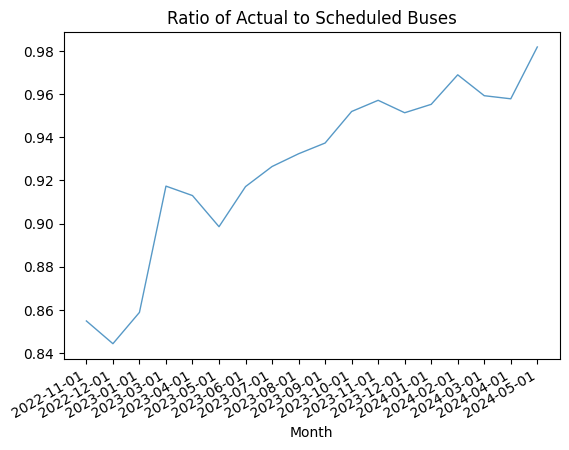

<Figure size 1000x1000 with 0 Axes>

In [74]:

filter = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'] >= '2022-11-01') & (bus_stops_grouped_month['period_value'] != '2023-02-01')]
overall = filter.groupby('period_value')[['schedule_count', 'actual_count']].sum().reset_index()
overall = pl.from_pandas(overall).with_columns((pl.col('actual_count') / pl.col('schedule_count')).alias('actual_to_schedule_ratio'))

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

ax.plot(overall.to_pandas()['period_value'], overall['actual_to_schedule_ratio'], label=ca,linewidth=1, alpha=0.75)


ax.set_xlabel('Month')
#ax.legend()
fig.autofmt_xdate()
ax.set_title('Ratio of Actual to Scheduled Buses')


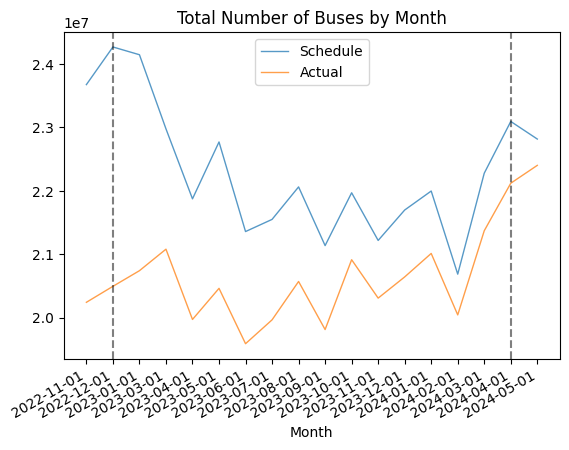

<Figure size 1000x2000 with 0 Axes>

In [80]:
fig, ax = plt.subplots()
plt.figure(figsize=(10,20))

filter = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'] >= '2022-11-01') & (bus_stops_grouped_month['period_value'] != '2023-02-01')]


overall = filter.groupby('period_value')[['schedule_count', 'actual_count']].sum().reset_index()
overall = overall[(overall['period_value'] < '2024-06-01') & (~overall['period_value'].isin(['2023-01-30', '2023-02-06']))]
CAs = filter['community'].unique()

filter = filter.sort_values(by = ['community','period_value'], ascending = [True, True])

#CAs = CAs[:4]

# for ca in CAs:
#     subset = filter[filter['community'] == ca]
#     ax.plot(subset['period_value'], subset['schedule_count'], label='Schedule',linewidth=1, alpha=0.75)
#     ax.plot(subset['period_value'], subset['actual_count'], label='Actual',linewidth=1, alpha=0.75)
ax.plot(overall['period_value'], overall['schedule_count'], label='Schedule',linewidth=1, alpha=0.75)
ax.plot(overall['period_value'], overall['actual_count'], label='Actual',linewidth=1, alpha=0.75)


ax.set_xlabel('Month')
ax.axvline(x='2022-12-01', color='black', linestyle='--', alpha=0.5)
ax.axvline(x='2024-04-01', color='black', linestyle='--', alpha=0.5)
fig.autofmt_xdate()
ax.set_title('Total Number of Buses by Month')
ax.legend()
plt.show()

In [82]:
overall.to_csv('out/for_chart/total_buses_compare.csv')

In [22]:
filters_ca.sort_values(by = ['community','period_value'], ascending = [True, True])

,community,period_value,actual_count,schedule_count,actual_to_schedule_ratio
1224,ALBANY PARK,2022-11-01,165154.0,201719.0,0.818733
442,ALBANY PARK,2022-12-01,164852.0,207285.0,0.795292
93,ALBANY PARK,2023-01-01,156066.0,205943.0,0.757812
1437,ALBANY PARK,2023-02-01,140651.0,105737.0,1.330197
917,ALBANY PARK,2023-03-01,160546.0,173362.0,0.926074
...,...,...,...,...,...
89,None,2023-05-01,1295910.0,1240032.0,1.045062
1435,None,2023-06-01,1246209.0,1175029.0,1.060577
1494,None,2023-07-01,1241310.0,1170741.0,1.060277
1606,None,2023-08-01,1291802.0,1243636.0,1.038730


/var/folders/vk/_03tl7qs1sv80_pgkhd8bxch0000gn/T/ipykernel_30686/1000471445.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  overall_max = filters_overall[overall_median['period_value']== '2023-07-01']['schedule_count'].values[0]


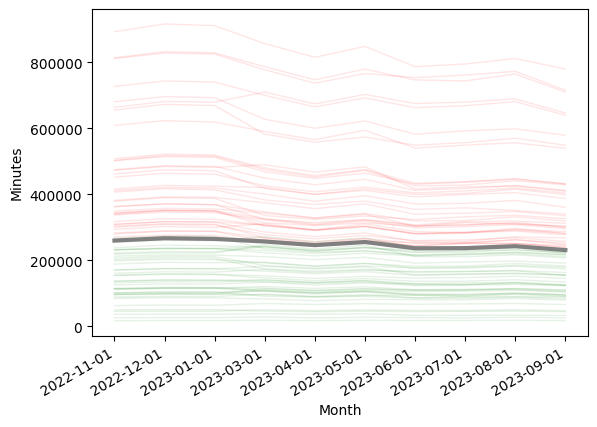

<Figure size 1000x1000 with 0 Axes>

In [25]:
#from '2022-12-01' to '2023-09-01'
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filters_ca = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'].between('2022-11-01', '2023-09-01')) & (bus_stops_grouped_month['period_value'] != '2023-02-01')]

overall_median = filter.groupby('period_value')[['schedule_count', 'actual_count']].median().reset_index()

filters_overall = overall_median[overall_median['period_value'].between('2022-11-01', '2023-09-01')]

overall_max = filters_overall[overall_median['period_value']== '2023-07-01']['schedule_count'].values[0]

CAs = bus_stops_grouped_month['community'].unique()

filters_ca = filters_ca.sort_values(by = ['community','period_value'], ascending = [True, True])
filters_overall = filters_overall.sort_values(by = ['period_value'], ascending = True)

for ca in CAs:
    subset = filters_ca[filters_ca['community'] == ca]
    if len(subset.index) == 0:
        continue
    if subset[subset['period_value'] == '2023-09-01']['schedule_count'].values[0] > overall_max:
        ax.plot(subset['period_value'], subset['schedule_count'], label=ca,linewidth=1, alpha=0.1, color = 'red')
    else:
        ax.plot(subset['period_value'], subset['schedule_count'], label=ca,linewidth=1, alpha=0.1, color = 'green')

ax.plot(filters_overall['period_value'], filters_overall['schedule_count'], label='overall', linewidth=3,color = 'grey')

ax.set_xlabel('Month')
ax.set_ylabel('Minutes')
fig.autofmt_xdate()
plt.show()


In [27]:
#TODO

period = 'month_abs'
bus_stops = stops.filter(pl.col('period') == period).select(['rt','pid','stop_id','period_value','community','median_actual_num_buses','median_schedule_num_buses'])
bus_stops = bus_stops.fill_null(0)
bus_stops_grouped = bus_stops.group_by(['community','period_value']).agg(pl.sum('median_actual_num_buses').alias('actual_count'), 
                                    pl.sum('median_schedule_num_buses').alias('schedule_count'))

bus_stops_grouped = bus_stops_grouped.with_columns((pl.col('actual_count') / pl.col('schedule_count')).alias('actual_to_schedule_ratio'))
bus_stops_grouped_month = bus_stops_grouped.to_pandas()

#set zero at 2022-11-01 level to see decrease


# Filter the df for the specified period
start_sched = bus_stops_grouped_month[bus_stops_grouped_month['period_value'] == '2022-11-01'][['community', 'schedule_count']]

# Rename the column 
start_sched = start_sched.rename(columns={'schedule_count': 'start_sched'})

# Merge the back into the original df
bus_stops_grouped_month = bus_stops_grouped_month.merge(start_sched, on='community', how='left')

bus_stops_grouped_month['comparative_sched'] = bus_stops_grouped_month['schedule_count'] - bus_stops_grouped_month['start_sched']

#overall to compare to
#baseline_sched = overall_median[overall_median['period_value'] == '2022-11-01']['schedule_count'].values[0]
#overall_median['comparative_sched'] = overall_median['schedule_count'] - baseline_sched

In [29]:
bus_stops_grouped_month.to_csv('out/for_chart/bus_change.csv')

/var/folders/vk/_03tl7qs1sv80_pgkhd8bxch0000gn/T/ipykernel_30686/1912155395.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  overall_max = filters_overall[overall_median['period_value']== '2023-07-01']['schedule_count'].values[0]


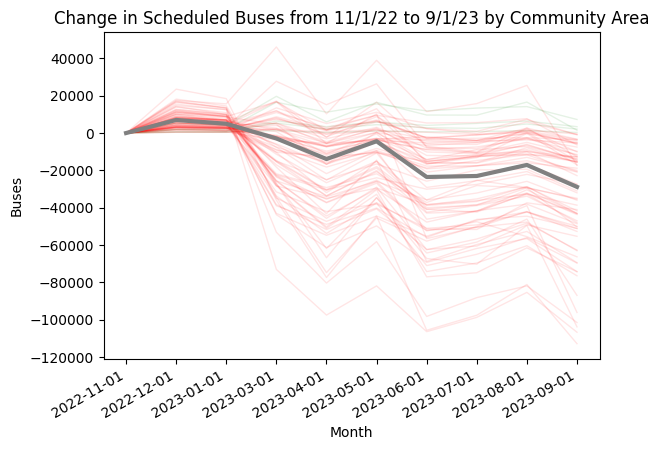

<Figure size 1000x1000 with 0 Axes>

5 ['HEGEWISCH', 'WEST PULLMAN', 'EDISON PARK', 'PULLMAN', 'RIVERDALE']


In [162]:
#from '2022-12-01' to '2023-09-01'
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filters_ca = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'].between('2022-11-01', '2023-09-01')) & (bus_stops_grouped_month['period_value'] != '2023-02-01')]

overall_median = filter.groupby('period_value')[['schedule_count', 'actual_count']].median().reset_index()
baseline_sched = overall_median[overall_median['period_value'] == '2022-11-01']['schedule_count'].values[0]
overall_median['comparative_sched'] = overall_median['schedule_count'] - baseline_sched

filters_overall = overall_median[overall_median['period_value'].between('2022-11-01', '2023-09-01')]

overall_max = filters_overall[overall_median['period_value']== '2023-07-01']['schedule_count'].values[0]

CAs = bus_stops_grouped_month['community'].unique()

filters_ca = filters_ca.sort_values(by = ['community','period_value'], ascending = [True, True])
filters_overall = filters_overall.sort_values(by = ['period_value'], ascending = True)

worse_ca = []
better_ca = []

for ca in CAs:
    subset = filters_ca[filters_ca['community'] == ca]
    if len(subset.index) == 0:
        continue
    if subset[subset['period_value'] == '2023-09-01']['comparative_sched'].values[0] < 0:
        ax.plot(subset['period_value'], subset['comparative_sched'], label=ca,linewidth=1, alpha=0.1, color = 'red')
        worse_ca.append(ca)
    else:
        ax.plot(subset['period_value'], subset['comparative_sched'], label=ca,linewidth=1, alpha=0.1, color = 'green')
        better_ca.append(ca)

ax.plot(filters_overall['period_value'], filters_overall['comparative_sched'], label='overall', linewidth=3,color = 'grey')

ax.set_xlabel('Month')
ax.set_ylabel('Buses')
fig.autofmt_xdate()
ax.set_title('Change in Scheduled Buses from 11/1/22 to 9/1/23 by Community Area')
plt.show()
print(len(better_ca), better_ca)

In [157]:
bus_stops_grouped_month

,community,period_value,actual_count,schedule_count,actual_to_schedule_ratio,start_sched,comparative_sched,start_sched_inc_x,comparative_sched_inc,start_sched_inc_y
0,EDGEWATER,2022-04-01,0.0,353457.0,0.000000,339388.0,14069.0,293978.0,59479.0,293978.0
1,NEW CITY,2023-12-01,381660.0,405368.0,0.941515,415900.0,-10532.0,384084.0,21284.0,384084.0
2,WEST PULLMAN,2023-10-01,222831.0,233036.0,0.956208,221445.0,11591.0,219565.0,13471.0,219565.0
3,BRIGHTON PARK,2022-07-01,265584.0,0.0,inf,309032.0,-309032.0,272857.0,-272857.0,272857.0
4,ENGLEWOOD,2023-11-01,302369.0,320339.0,0.943903,362181.0,-41842.0,313429.0,6910.0,313429.0
...,...,...,...,...,...,...,...,...,...,...
2102,LAKE VIEW,2023-11-01,524540.0,551237.0,0.951569,655433.0,-104196.0,544928.0,6309.0,544928.0
2103,MONTCLARE,2023-03-01,83089.0,90980.0,0.913267,101215.0,-10235.0,85582.0,5398.0,85582.0
2104,LINCOLN PARK,2022-11-01,397627.0,461497.0,0.861603,461497.0,0.0,382626.0,78871.0,382626.0
2105,WEST ELSDON,2022-05-01,0.0,88225.0,0.000000,84421.0,3804.0,78529.0,9696.0,78529.0


In [8]:
# set zero at 2024-02-01 level to see increase
baseline_date = '2024-02-01'
# Filter the df for the specified period
start_sched = bus_stops_grouped_month[bus_stops_grouped_month['period_value'] == baseline_date][['community', 'schedule_count']]

# Rename the column 
start_sched = start_sched.rename(columns={'schedule_count': 'start_sched_inc'})

# Merge the back into the original df
bus_stops_grouped_month = bus_stops_grouped_month.merge(start_sched, on='community', how='left')

bus_stops_grouped_month['comparative_sched_inc'] = bus_stops_grouped_month['schedule_count'] - bus_stops_grouped_month['start_sched_inc']

#overall to compare to
baseline_sched = overall_median[overall_median['period_value'] == baseline_date]['schedule_count'].values[0]
overall_median['comparative_sched_inc'] = overall_median['schedule_count'] - baseline_sched

NameError: name 'bus_stops_grouped_month' is not defined

In [51]:
bus_stops_grouped_month

,community,period_value,actual_count,schedule_count,actual_to_schedule_ratio,start_sched,comparative_sched,start_sched_inc,comparative_sched_inc
0,EDGEWATER,2022-04-01,0.0,353457.0,0.000000,339388.0,14069.0,293978.0,59479.0
1,NEW CITY,2023-12-01,381660.0,405368.0,0.941515,415900.0,-10532.0,384084.0,21284.0
2,WEST PULLMAN,2023-10-01,222831.0,233036.0,0.956208,221445.0,11591.0,219565.0,13471.0
3,BRIGHTON PARK,2022-07-01,265584.0,0.0,inf,309032.0,-309032.0,272857.0,-272857.0
4,ENGLEWOOD,2023-11-01,302369.0,320339.0,0.943903,362181.0,-41842.0,313429.0,6910.0
...,...,...,...,...,...,...,...,...,...
2102,LAKE VIEW,2023-11-01,524540.0,551237.0,0.951569,655433.0,-104196.0,544928.0,6309.0
2103,MONTCLARE,2023-03-01,83089.0,90980.0,0.913267,101215.0,-10235.0,85582.0,5398.0
2104,LINCOLN PARK,2022-11-01,397627.0,461497.0,0.861603,461497.0,0.0,382626.0,78871.0
2105,WEST ELSDON,2022-05-01,0.0,88225.0,0.000000,84421.0,3804.0,78529.0,9696.0


/var/folders/vk/_03tl7qs1sv80_pgkhd8bxch0000gn/T/ipykernel_30686/1271341102.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  overall_max = filters_overall[overall_median['period_value']== end_date]['schedule_count'].values[0]


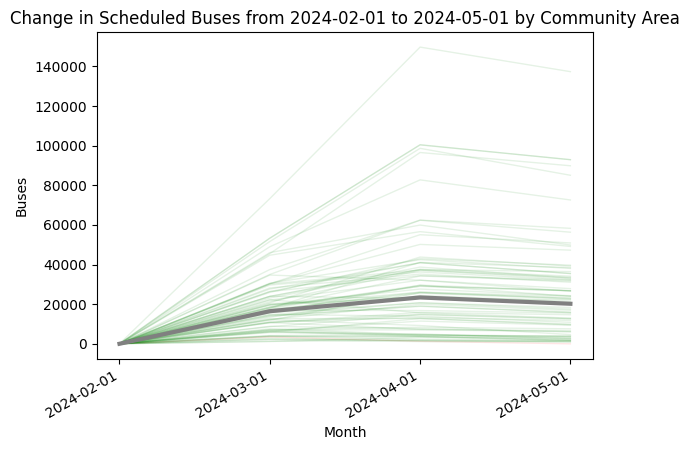

<Figure size 1000x1000 with 0 Axes>

76 ['HERMOSA', 'BEVERLY', 'NORTH PARK', 'LINCOLN SQUARE', 'HEGEWISCH', 'GRAND BOULEVARD', 'BRIDGEPORT', 'MORGAN PARK', 'NEW CITY', 'ROSELAND', 'WEST RIDGE', 'FULLER PARK', 'LINCOLN PARK', 'WASHINGTON PARK', 'SOUTH LAWNDALE', 'EAST SIDE', 'UPTOWN', 'WEST PULLMAN', 'KENWOOD', 'HUMBOLDT PARK', 'NORTH LAWNDALE', 'EDISON PARK', 'GARFIELD RIDGE', 'WEST GARFIELD PARK', 'CHICAGO LAWN', 'DUNNING', 'PULLMAN', 'LOWER WEST SIDE', 'EAST GARFIELD PARK', 'HYDE PARK', 'OAKLAND', 'WEST TOWN', 'WASHINGTON HEIGHTS', 'AUBURN GRESHAM', 'ENGLEWOOD', 'BURNSIDE', 'LAKE VIEW', 'CLEARING', 'NEAR WEST SIDE', 'AVALON PARK', 'PORTAGE PARK', 'FOREST GLEN', 'JEFFERSON PARK', 'OHARE', 'BRIGHTON PARK', 'MONTCLARE', 'ARMOUR SQUARE', 'AVONDALE', 'GAGE PARK', 'GREATER GRAND CROSSING', 'NORWOOD PARK', 'ROGERS PARK', 'IRVING PARK', 'EDGEWATER', 'BELMONT CRAGIN', 'LOGAN SQUARE', 'CALUMET HEIGHTS', 'NORTH CENTER', 'SOUTH DEERING', 'RIVERDALE', 'ASHBURN', 'MCKINLEY PARK', 'WEST LAWN', 'MOUNT GREENWOOD', 'SOUTH SHORE', 'ALBANY

In [164]:
#from '2024-02-01' to '2024-04-01'
start_date = '2024-02-01'
end_date = '2024-05-01'
fig, ax = plt.subplots()
plt.figure(figsize=(10,10))

filters_ca = bus_stops_grouped_month[(bus_stops_grouped_month['period_value'].between(start_date, end_date)) & (bus_stops_grouped_month['period_value'] != '2023-02-01')]

overall_median = filter.groupby('period_value')[['schedule_count', 'actual_count']].median().reset_index()
baseline_sched = overall_median[overall_median['period_value'] == baseline_date]['schedule_count'].values[0]
overall_median['comparative_sched_inc'] = overall_median['schedule_count'] - baseline_sched

filters_overall = overall_median[overall_median['period_value'].between(start_date, end_date)]

overall_max = filters_overall[overall_median['period_value']== end_date]['schedule_count'].values[0]

CAs = bus_stops_grouped_month['community'].unique()

filters_ca = filters_ca.sort_values(by = ['community','period_value'], ascending = [True, True])
filters_overall = filters_overall.sort_values(by = ['period_value'], ascending = True)

worse_ca = []
better_ca = []

for ca in CAs:
    subset = filters_ca[filters_ca['community'] == ca]
    if len(subset.index) == 0:
        continue
    if subset[subset['period_value'] == end_date]['comparative_sched_inc'].values[0] < 0:
        ax.plot(subset['period_value'], subset['comparative_sched_inc'], label=ca,linewidth=1, alpha=0.1, color = 'red')
        worse_ca.append(ca)
    else:
        ax.plot(subset['period_value'], subset['comparative_sched_inc'], label=ca,linewidth=1, alpha=0.1, color = 'green')
        better_ca.append(ca)

ax.plot(filters_overall['period_value'], filters_overall['comparative_sched_inc'], label='overall', linewidth=3,color = 'grey')

ax.set_xlabel('Month')
ax.set_ylabel('Buses')
fig.autofmt_xdate()

ax.set_title('Change in Scheduled Buses from ' + start_date + ' to ' + end_date + ' by Community Area')
plt.show()
print(len(better_ca), better_ca)

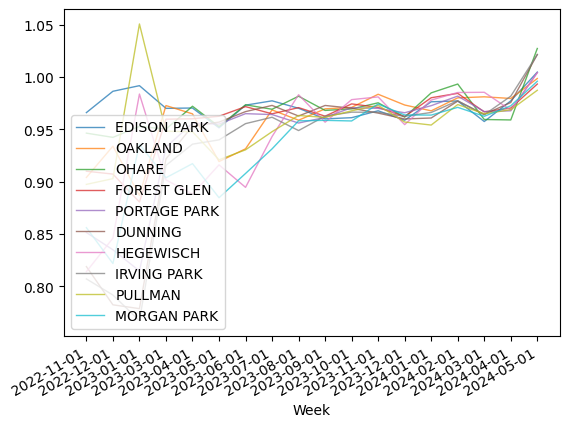

<Figure size 1000x1000 with 0 Axes>

Worst Serviced (By bus count) communities:
['EDISON PARK' 'OAKLAND' 'OHARE' 'FOREST GLEN' 'PORTAGE PARK' 'DUNNING'
 'HEGEWISCH' 'IRVING PARK' 'PULLMAN' 'MORGAN PARK']


In [336]:
filter = bus_stops_grouped[(bus_stops_grouped['period_value'] >= '2022-11-01') & (bus_stops_grouped['period_value'] != '2023-02-01')]
filter = filter.sort_values(by = ['community','period_value'], ascending = [True, True])


worst_serviced_buses = filter.groupby('community').median('actual_to_schedule_ratio').sort_values('actual_to_schedule_ratio', ascending=False).head(10).reset_index()['community'].unique()

fig, ax = plt.subplots()
plt.figure(figsize=(10,10))
CAs = worst_serviced_buses

for ca in CAs:
    subset = filter[filter['community'] == ca]
    ax.plot(subset['period_value'], subset['actual_to_schedule_ratio'], label=ca,linewidth=1, alpha=0.75)


ax.set_xlabel('Week')

fig.autofmt_xdate()
ax.legend(loc='lower left')

plt.show()

print("Worst Serviced (By bus count) communities:")
print(worst_serviced_buses)

ca_boundaries[ca_boundaries['community'].isin(worst_serviced_buses)].explore()

Also looked at 
1. Number of buses overtime, pretty similar over
2. Median trip length, schedule stayed the same, actual trips have gotten ~3 min longer over time
3. Variation in weight time has decreased slightly, much different than schedule
4. variation in trip duration has increased over time

1. num buses

In [ ]:

#what about for number of buses? not much here
num_buses = stops
num_buses = num_buses.filter(pl.col('period') == 'month_abs')

bus_by_stop = num_buses.group_by(['period_value', 'stop_id']).agg(pl.col(['median_actual_num_buses','median_schedule_num_buses']).sum())
bus_by_stop = bus_by_stop.filter((pl.col('median_actual_num_buses') > 0) & (pl.col('median_schedule_num_buses') > 0))
final = bus_by_stop.group_by('period_value').agg(pl.col(['median_actual_num_buses','median_schedule_num_buses']).median())

final.to_pandas().plot(x='period_value', y=['median_actual_num_buses', 'median_schedule_num_buses'], title='Median number of buses over time', xlabel='month', ylabel='number of buses')


2. Same thing for trips?
not really, median trip length has not changed while, trips have gotten longer (3 minute increase)

<Axes: title={'center': 'Median trip duration over time'}, xlabel='week', ylabel='minutes'>

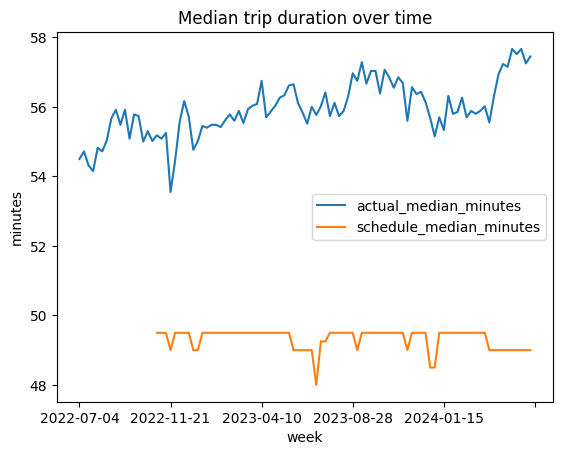

In [193]:

actual = weighted_metric(trips, 'week_abs', 'median_actual_trip_duration', 'count_actual_trip_duration')
schedule = weighted_metric(trips, 'week_abs', 'median_schedule_trip_duration', 'count_schedule_trip_duration')

join = join_df(actual, schedule)
join[join['period_value'] >= '2022-07-01'].plot(x='period_value', y=['actual_median_minutes', 'schedule_median_minutes'], title='Median trip duration over time', xlabel='week', ylabel='minutes')

3. Measuring variation in weight time by 75q - 25q, there has been a slight decrease in actual but still much higher than the schedule expects

<Axes: title={'center': 'Variation in Bus Time'}, xlabel='week', ylabel='minutes'>

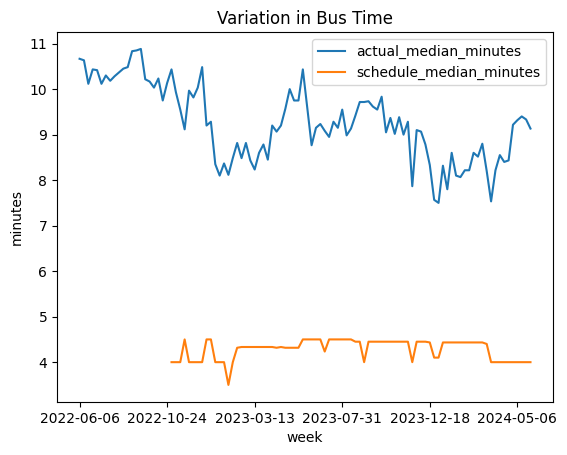

In [210]:
#how has wait time variation changed as measured by 75 - 25
stops = stops.with_columns(actual_time_between_variation = (pl.col('q75_actual_time_till_next_bus') - pl.col('q25_actual_time_till_next_bus')),
                           schedule_time_between_variation = (pl.col('q75_schedule_time_till_next_bus') - pl.col('q25_schedule_time_till_next_bus')))

actual = weighted_metric(stops, 'week_abs', 'actual_time_between_variation', 'count_actual_time_till_next_bus')
schedule = weighted_metric(stops, 'week_abs', 'schedule_time_between_variation' , 'count_schedule_time_till_next_bus')
join = join_df(actual, schedule)
join.plot(x='period_value', y=['actual_median_minutes', 'schedule_median_minutes'], title='Variation in Bus Time', xlabel='week', ylabel='minutes')


4. Variation in trip duration has increased over time

<Axes: title={'center': 'Variation in trip duration over time'}, xlabel='week', ylabel='minutes'>

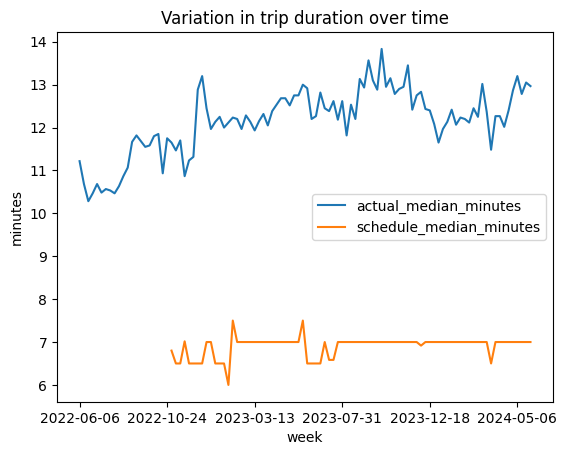

In [175]:
trips = trips.with_columns(actual_trip_duration_variation = (pl.col('q75_actual_trip_duration') - pl.col('q25_actual_trip_duration')),
                           schedule_trip_duration_variation = (pl.col('q75_schedule_trip_duration') - pl.col('q25_schedule_trip_duration')))


actual = weighted_metric(trips, 'week_abs', 'actual_trip_duration_variation', 'count_actual_trip_duration')
schedule = weighted_metric(trips, 'week_abs', 'schedule_trip_duration_variation', 'count_schedule_trip_duration')

join = join_df(actual, schedule)

join[join['period_value'] >= '2022-06-01'].plot(x='period_value', y=['actual_median_minutes', 'schedule_median_minutes'], title='Variation in trip duration over time', xlabel='week', ylabel='minutes')

## Charts for Presentation

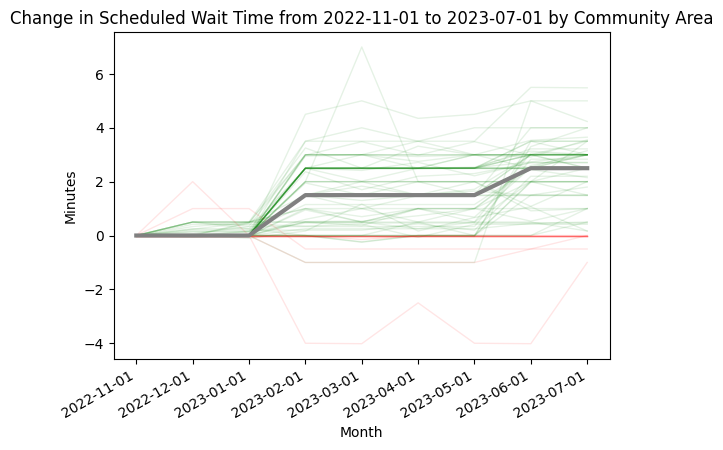

<Figure size 1000x1000 with 0 Axes>

In [11]:
# Increase in Wait time from 22 - 23

worse_ca, better_ca, filters_ca, join_month_ca_compare_inc, filters_overall_inc = plot_wait_time_change(join_month_ca,'2022-11-01', '2023-07-01', 'inc')

#create map for continous increase by community area
increase_22_23 = join_month_ca_compare_inc[join_month_ca_compare_inc['period_value'] == '2023-06-01'][['community','comparative_sched_inc']]
increase_22_23['community'] = increase_22_23['community'].astype(str)
areas = ca_boundaries[['community','geometry']]

#with boundaries
increase_22_23 = increase_22_23.merge(areas, on='community', how='left')

increase_22_23 = gpd.GeoDataFrame(increase_22_23, geometry='geometry')
increase_22_23 = increase_22_23[increase_22_23['comparative_sched_inc'] > -4]

style_kwds={
        "style_function": lambda feature: {
        "fillColor": colormap(dict[feature["community"]]),
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5"
    }}
colormap = cm.LinearColormap(["red", "orange", "yellow", "green"], index=[0, 0.1, 0.9, 1.0])


dict = increase_22_23.set_index("community")["comparative_sched_inc"]


m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)



colormap = cm.LinearColormap(["steelblue", "white", "#800000"], index=[-4, 0,4] ,vmax = 4, vmin = -4)
dict = increase_22_23.set_index("community")["comparative_sched_inc"]


folium.GeoJson(
    increase_22_23,
    style_function=lambda feature: {
        "fillColor": colormap(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
).add_to(m)

colormap.caption = "Change in Scheduled Time Until Next Bus"

m.add_child(colormap.scale(-4, 4))

m



In [12]:
increase_22_23

,community,comparative_sched_inc,geometry
0,WEST GARFIELD PARK,1.083333,"MULTIPOLYGON (((-87.72024 41.86987, -87.72023 ..."
1,HUMBOLDT PARK,2.000000,"MULTIPOLYGON (((-87.69157 41.8882, -87.69501 4..."
2,AVONDALE,2.000000,"MULTIPOLYGON (((-87.68799 41.9361, -87.68798 4..."
3,ASHBURN,1.066667,"MULTIPOLYGON (((-87.71255 41.75734, -87.71252 ..."
4,WEST TOWN,1.483333,"MULTIPOLYGON (((-87.65686 41.91078, -87.65685 ..."
...,...,...,...
72,HEGEWISCH,0.000000,"MULTIPOLYGON (((-87.52462 41.6918, -87.52465 4..."
73,GARFIELD RIDGE,0.000000,"MULTIPOLYGON (((-87.73856 41.81871, -87.73853 ..."
75,CLEARING,0.000000,"MULTIPOLYGON (((-87.73762 41.78578, -87.73761 ..."
76,NORWOOD PARK,-0.500000,"MULTIPOLYGON (((-87.78002 41.99741, -87.78049 ..."


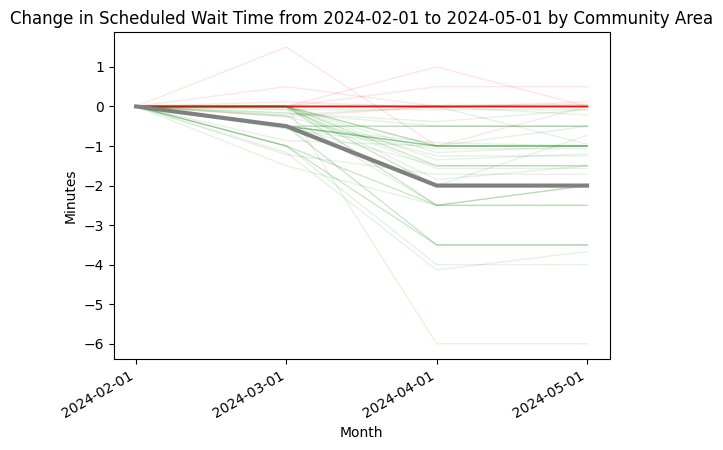

<Figure size 1000x1000 with 0 Axes>

In [33]:
#decrease in March 24
worse_ca, better_ca, filters_ca, join_month_ca_compare_desc,filters_overall_desc = plot_wait_time_change(join_month_ca,'2024-02-01', '2024-05-01', 'dec')
#create map for continous increase by community area
decrease_24 = join_month_ca_compare_desc[join_month_ca_compare_desc['period_value'] == '2024-05-01'][['community','comparative_sched_inc']]

#with boundaries
decrease_24 = decrease_24.merge(areas, on='community', how='left')

decrease_24 = decrease_24.dropna()

decrease_24 = gpd.GeoDataFrame(decrease_24, geometry='geometry')
# decrease_24 = increase_22_23[decrease_24['comparative_sched_inc'] > -4]


style_kwds={
        "style_function": lambda feature: {
        "fillColor": colormap(dict[feature["community"]]),
        "color": "black",
        "weight": 2,
        "dashArray": "5, 5"
    }}

["green", "red", "orange", "yellow"]


dict = decrease_24.set_index("community")["comparative_sched_inc"]


m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)


tooltip = folium.GeoJsonTooltip(
    fields=["community", "comparative_sched_inc"],
    aliases=["Community Area:", "comparative_sched_inc:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)



colormap = cm.LinearColormap(["steelblue", "white", "#800000"], index=[-4, 0,4] ,vmax = 4, vmin = -4)
dict = decrease_24.set_index("community")["comparative_sched_inc"]

# folium.Choropleth(
#     geo_data=decrease_24,
#     data=decrease_24,
#     columns=["community", "comparative_sched_inc"],
#     key_on="feature.properties.community",
#     fill_color="RdYlGn",
#     bins=[-6, -3, 0,1]
# ).add_to(m)

folium.GeoJson(
    decrease_24,
    style_function=lambda feature: {
        "fillColor": colormap(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
    tooltip=tooltip
).add_to(m)

colormap.caption = "Change in Scheduled Time Until Next Bus"
m.add_child(colormap.scale(-4, 4))

m


In [36]:
decrease_24.to_csv('out/for_chart/decrease_24.csv')


In [45]:
#net change from 22 to 24

net_change = join_month_ca_compare_inc[join_month_ca_compare_inc['period_value'] == '2024-05-01'][['community','comparative_sched_inc']]
net_change['community'] = net_change['community'].astype(str)

#with boundaries
net_change = net_change.merge(areas, on='community', how='left')

net_change = gpd.GeoDataFrame(net_change, geometry='geometry')
net_change['reverse'] = net_change['comparative_sched_inc'] *-1
net_change = net_change.dropna()
net_change_edit = net_change[net_change['comparative_sched_inc'] > -2]

m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)


tooltip = folium.GeoJsonTooltip(
    fields=["community", "comparative_sched_inc"],
    aliases=["Community Area:", "comparative_sched_inc:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)



colormap3 = cm.LinearColormap(["green", "yellow","orange", "red"], index=[-2, 0, 2,4], vmin=-4, vmax=4)
dict = net_change.set_index("community")["comparative_sched_inc"]

# folium.Choropleth(
#     geo_data=net_change,
#     data=net_change,
#     columns=["community", "comparative_sched_inc"],
#     key_on="feature.properties.community",
#     fill_color="RdYlGn",
#     fill_opacity=.9,
#     color = 'black',
#     weight =  .5,
#     # bins=[-6, -3, 0,1]
#     tooltip=tooltip
# ).add_to(m)

folium.GeoJson(
    net_change,
    style_function=lambda feature: {
        "fillColor": colormap(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
    tooltip=tooltip
).add_to(m)

colormap.caption = "Change in Scheduled Time Until Next Bus"

m.add_child(colormap)

m

In [ ]:
#net change from 22 to 24

net_change = join_month_ca_compare_inc[join_month_ca_compare_inc['period_value'] == '2024-05-01'][['community','comparative_sched_inc']]
net_change['community'] = net_change['community'].astype(str)

#with boundaries
net_change = net_change.merge(areas, on='community', how='left')

net_change = gpd.GeoDataFrame(net_change, geometry='geometry')
net_change['reverse'] = net_change['comparative_sched_inc'] *-1
net_change = net_change.dropna()
net_change_edit = net_change[net_change['comparative_sched_inc'] > -2]

m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)


tooltip = folium.GeoJsonTooltip(
    fields=["community", "comparative_sched_inc"],
    aliases=["Community Area:", "comparative_sched_inc:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)



colormap3 = cm.LinearColormap(["green", "yellow","orange", "red"], index=[-2, 0, 2,4], vmin=-4, vmax=4)
dict = net_change.set_index("community")["comparative_sched_inc"]

# folium.Choropleth(
#     geo_data=net_change,
#     data=net_change,
#     columns=["community", "comparative_sched_inc"],
#     key_on="feature.properties.community",
#     fill_color="RdYlGn",
#     fill_opacity=.9,
#     color = 'black',
#     weight =  .5,
#     # bins=[-6, -3, 0,1]
#     tooltip=tooltip
# ).add_to(m)

folium.GeoJson(
    net_change,
    style_function=lambda feature: {
        "fillColor": colormap(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
    tooltip=tooltip
).add_to(m)

colormap.caption = "Change in Scheduled Time Until Next Bus"

m.add_child(colormap)

m

In [16]:


#find median wait time in 2024 for map
areas = ca_boundaries[['community','geometry']]

wait_time2024_ = join_month_ca[join_month_ca['period_value'].str.contains('2024')]

wait_time2024_ = wait_time2024_.groupby('community').median('actual_median_minutes').reset_index()
wait_time2024_ = wait_time2024_.merge(areas, on='community', how='left')

wait_time2024_ = wait_time2024_.dropna()

m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)


tooltip = folium.GeoJsonTooltip(
    fields=["community", "actual_median_minutes"],
    aliases=["Community Area:", "actual_median_minutes:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)



colormap_wait = cm.LinearColormap(['white','#800000'], vmin=10, vmax=20, )
dict = wait_time2024_.set_index("community")["actual_median_minutes"]

# folium.Choropleth(
#     geo_data=areas,
#     data=wait_time2024,
#     columns=["community", "actual_median_minutes"],
#     key_on="feature.properties.community",
#     fill_color=colormap_wait,
#     fill_opacity=.9,
#     color = 'black',
#     weight =  .5,
#     tooltip=tooltip
# ).add_to(m)

folium.GeoJson(
    gpd.GeoDataFrame(wait_time2024_, geometry='geometry'),
    style_function=lambda feature: {
        "fillColor": colormap_wait(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
    tooltip=tooltip
).add_to(m)

colormap_wait.caption = "Median Time Until Next Bus in 2024"

m.add_child(colormap_wait.scale(10,25))
m


In [18]:
period = 'month_abs'
bus_stops = stops.filter(pl.col('period') == period).select(['rt','pid','stop_id','period_value','community','median_actual_num_buses','median_schedule_num_buses'])
bus_stops = bus_stops.fill_null(0)
bus_stops_grouped = bus_stops.group_by(['community','period_value']).agg(pl.sum('median_actual_num_buses').alias('actual_count'), 
                                    pl.sum('median_schedule_num_buses').alias('schedule_count'))

bus_stops_grouped = bus_stops_grouped.with_columns((pl.col('actual_count') / pl.col('schedule_count')).alias('actual_to_schedule_ratio'))
bus_stops_grouped_month = bus_stops_grouped.to_pandas()

bus_count2024 = bus_stops_grouped_month[bus_stops_grouped_month['period_value'].str.contains('2024')]

bus_count2024 = bus_count2024.groupby('community').median('actual_count').reset_index()
bus_count2024 = bus_count2024[['community', 'actual_count']]

ca_stats = pd.read_csv('data/chicago_communities.csv')
ca_stats= ca_stats.rename(columns={'GEOG': 'community', 'TOT_POP': 'population'})
ca_stats = ca_stats[['community', 'population']]

bus_count2024 = bus_count2024.merge(ca_stats, on='community', how='left')
bus_count2024['buses_per_capita'] = bus_count2024['actual_count'] / bus_count2024['population']
bus_count2024 = bus_count2024.merge(areas, on='community', how='left')

In [19]:
m = folium.Map(
    location=[41.83491987636846, -87.62004994799588],
    zoom_start=10.5,
    zoomSnap=0.5,
    tiles=None,
    min_zoom=10,
    max_zoom=12,
)
base_map = folium.FeatureGroup(name="Basemap", overlay=True, control=False)
folium.TileLayer(tiles="cartodb positron").add_to(base_map)
base_map.add_to(m)


tooltip = folium.GeoJsonTooltip(
    fields=["community", "buses_per_capita"],
    aliases=["Community Area:", "Buses per Capita:"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)



colormap_bus_pc = cm.LinearColormap(['white','steelblue'], vmin=0, vmax=20)
dict = bus_count2024.set_index("community")["buses_per_capita"]

# folium.Choropleth(
#     geo_data=areas,
#     data=bus_count2024,
#     columns=["community", "buses_per_capita"],
#     key_on="feature.properties.community",
#     fill_color="Greens",
#     fill_opacity=.9,
#     color = 'black',
#     weight =  .5,
#     # bins=[-6, -3, 0,1]
#     tooltip=tooltip
# ).add_to(m)

folium.GeoJson(
    gpd.GeoDataFrame(bus_count2024, geometry='geometry'),
    style_function=lambda feature: {
        "fillColor": colormap_bus_pc(dict[feature['properties']["community"]]),
        "color": 'black',
        "weight": .5,
        'fillOpacity': .7,
    },
    tooltip=tooltip
).add_to(m)

colormap_bus_pc.caption = "Median Monthly Buses per Capita"

m.add_child(colormap_bus_pc)
m
